## 16. Challenge:  Factors that affect life expectancy

To complete this challenge, submit a Jupyter notebook containing your solutions to the following tasks. Moreover, you can also submit a kernel to the Kaggle containing your solutions.

* Your goal in this challenge is to find the factors that affect the life expectancy. Specifically, you need to find out which factors increase the expected life in the countries and which factors decrease it.

* First, load the dataset.

* Detect the problems with the data such as missing values and outliers. Are there any nonsense values that seem to be stemmed from the data collection? For the missing values, discuss which technique would be the most suitable one in filling out these values. Regarding the outliers, discuss their potential effects on your analysis and select an appropriate method to deal with them.

* Explore the data using univariate and multivariate exploration techniques. You should pay special attention to your target variable. In this regard, your focus should be on finding the relevant variables that may affect life expectancy.

* In the feature engineering step, you need to select a suite of variables that you think would be ideal in the modeling phase. More concretely, you may discard some variables that are very correlated with the other ones or the variables that you think irrelevant with the life expectancy.

* Summarize your findings. One of the most important skills of a data scientist is to convey ideas and findings to nontechnical people using understandable language. In this regard, one of the most effective ways to communicate your ideas is to do it using effective visualization.

###### showing all rows and columns 
- pd.set_option('display.max_columns', 500)
- pd.set_option('display.max_rows', 500)

#### check code before submission
http://pep8online.com/

In [2]:
### importing all libraries

import pandas as pd
import numpy as np
from sqlalchemy import create_engine
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import zscore
from scipy.stats.mstats import winsorize
%matplotlib inline 

from scipy.stats import jarque_bera
from scipy.stats import normaltest
from scipy.stats import boxcox
from scipy.stats import yeojohnson

# These two lines let you show all the columns and rows
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

warnings.filterwarnings('ignore')

In [3]:
### connecting to database
postgres_user = 'dsbc_student'
postgres_pw = '7*.8G9QH21'
postgres_host = '142.93.121.174'
postgres_port = '5432'
postgres_db = 'lifeexpectancy'
table_name = 'lifeexpectancy'

## load the dataset.

In [4]:
### query the data and load the data
engine = create_engine('postgresql://{}:{}@{}:{}/{}'.format(
    postgres_user, postgres_pw, postgres_host, postgres_port, postgres_db))

df = pd.read_sql_query('select * from lifeexpectancy',con=engine)

# no need for an open connection, 
# as we're only doing a single query
engine.dispose()

In [5]:
### take a look at the data and see what format they are
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
Country                            2938 non-null object
Year                               2938 non-null int64
Status                             2938 non-null object
Life expectancy                    2928 non-null float64
Adult Mortality                    2928 non-null float64
infant deaths                      2938 non-null int64
Alcohol                            2744 non-null float64
percentage expenditure             2938 non-null float64
Hepatitis B                        2385 non-null float64
Measles                            2938 non-null int64
 BMI                               2904 non-null float64
under-five deaths                  2938 non-null int64
Polio                              2919 non-null float64
Total expenditure                  2712 non-null float64
Diphtheria                         2919 non-null float64
 HIV/AIDS                          2938 non-null

In [6]:
# lets look at some data to see how they look
df.head(5)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [7]:
### lets get an understanding of which columns are categorical and which are numberic
numeric_columns = df.select_dtypes(['int64','float64']).columns
print(numeric_columns)

Index(['Year', 'Life expectancy ', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')


In [8]:
non_numeric_columns = df.select_dtypes(['object']).columns
print(non_numeric_columns)

Index(['Country', 'Status'], dtype='object')


In [9]:
## change the column names to take care of the spaces
df.rename(columns={'Year':'year','Life expectancy ':'life_expectancy', 
                   'Adult Mortality':'adult_mortality', 'infant deaths':'infant_deaths',
                   'Alcohol':'alcohol', 'percentage expenditure':'percentage_expenditure', 
                   'Hepatitis B':'hepatitis_b', 'Measles ':'measles', ' BMI ':'bmi',
                   'under-five deaths ':'under-five_deaths', 'Polio':'polio', 
                   'Total expenditure':'total_expenditure', 'Diphtheria ': 'diphtheria',
                   ' HIV/AIDS':'HIV/AIDS', 'GDP':'GDP', 'Population': 'population', 
                   ' thinness  1-19 years':'thinness_1_19_years',
                   ' thinness 5-9 years':'thinness_5_9_years',
                   'Income composition of resources': 'Income_comp_resources', 
                   'Schooling': 'schooling'},inplace=True)

### Detect the problems with the data
* Detect the problems with the data such as missing values and outliers. 
* Are there any nonsense values that seem to be stemmed from the data collection? 
* For the missing values, discuss which technique would be the most suitable one in filling out these values. 

In [10]:
### Detect the problems with the data such as missing values and outliers.
## Do we have any missing values?

# Looks like nothing is more than 50% so we don't need to drop any columns
df.isnull().sum()*100/df.isnull().count()

### other ways to see missing value
### value_counts()

Country                    0.000000
year                       0.000000
Status                     0.000000
life_expectancy            0.340368
adult_mortality            0.340368
infant_deaths              0.000000
alcohol                    6.603131
percentage_expenditure     0.000000
hepatitis_b               18.822328
measles                    0.000000
bmi                        1.157250
under-five_deaths          0.000000
polio                      0.646698
total_expenditure          7.692308
diphtheria                 0.646698
HIV/AIDS                   0.000000
GDP                       15.248468
population                22.191967
thinness_1_19_years        1.157250
thinness_5_9_years         1.157250
Income_comp_resources      5.684139
schooling                  5.547992
dtype: float64

* Looks like there are some missing values. There are none that have more than 50% of the data missing. So instead of dropping any, lets fill them all up with some data. The things to consider here are mean of the columns or interpolations. 

* things to consider: But before we fill in missing values, we want to think about how do we handle the missing values. If we use the mean of a column to fill in missing values then it will very important to take care of outliers first before we find the mean for a column.

* in this case, I will use interpolate to take care of missing values. so we can just do that 

### Taking care of missing values

In [11]:
## IN this case, using interpolation would be a better choice
# just to be safe, lets make a copy of the data frame
df_lifeExpectancy = df.copy()
#take care of missing values using interpolation - 
df_lifeExpectancy = df_lifeExpectancy.interpolate()

In [ ]:
## if we wanted, we could ahve Taken care of missing values using mean()
#df_orig = df.copy()
## take care of the nulls using the mean
#cols = ["Life expectancy ","Adult Mortality","Alcohol", "Hepatitis B"," BMI ","Polio","Total expenditure","Diphtheria ","GDP","Population"," thinness  1-19 years"," thinness 5-9 years","Income composition of resources","Schooling"]
#df[cols]=df[cols].fillna(df.mean().iloc[0])
#df['Hepatitis B'] = df.fillna(df['Hepatitis B'].mean())
#df['Hepatitis B'] = df.fillna(df['Hepatitis B'].mean())

In [12]:
## check to see if missing values are taken care of
df_lifeExpectancy.isnull().sum()*100/df_lifeExpectancy.isnull().count()

Country                   0.0
year                      0.0
Status                    0.0
life_expectancy           0.0
adult_mortality           0.0
infant_deaths             0.0
alcohol                   0.0
percentage_expenditure    0.0
hepatitis_b               0.0
measles                   0.0
bmi                       0.0
under-five_deaths         0.0
polio                     0.0
total_expenditure         0.0
diphtheria                0.0
HIV/AIDS                  0.0
GDP                       0.0
population                0.0
thinness_1_19_years       0.0
thinness_5_9_years        0.0
Income_comp_resources     0.0
schooling                 0.0
dtype: float64

### Outliers: 
* Regarding the outliers, discuss their potential effects on your analysis and select an appropriate method to deal with them.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a206ab090>,
      dtype=object)

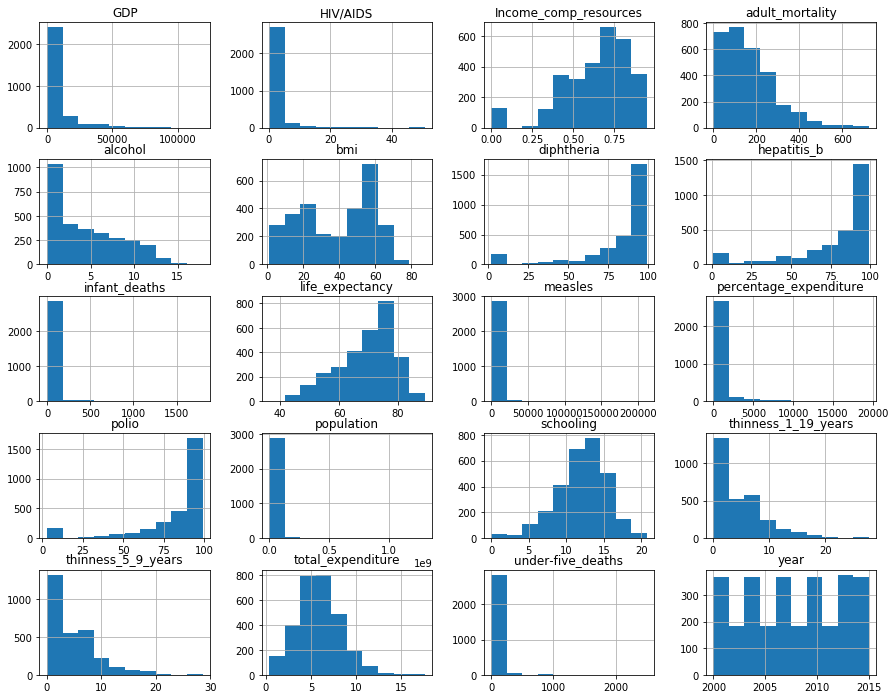

In [13]:
### Lets plot histogram and see the distribution as well as any indication of outliers

#plt.figure(figsize=(15, 12))
df_lifeExpectancy.hist(figsize=(15, 12))
#plt.tight_layout()

* Most of these don't seem to be normal... 
* Histograms are not always the best way to see if the data is normally distributed or not. We can see this by plotting box plot. the following box plots will tell us that. From the histogram, it seems like schooling and total_expenditure are sort of normal but when we do a box plot, it shows that it has outliers.

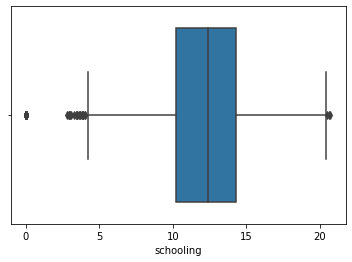

In [14]:
sns.boxplot(x=df_lifeExpectancy['schooling'])

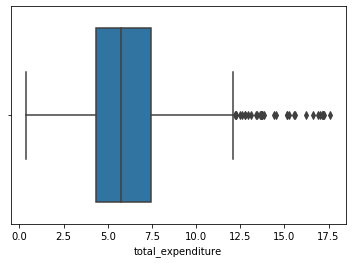

In [15]:
sns.boxplot(x=df_lifeExpectancy['total_expenditure'])

* So we have 2 problems here - We have outliers and it does not seem like our distributions are normal - lets check the normal distribution part. We can do that using Jacque-Bera and normal test. 

In [16]:
### normality test and normality converion box cox requires numbers and 
### values has to be positive. Lets drop the categorical columns
### if we want the categorical columns then we have to use dummy data. 
### For now we will drop them
df_lifeExpectancy.drop(columns=['Country','Status'], inplace=True)

In [17]:
jb_stats = jarque_bera(df_lifeExpectancy)
norm_stats = normaltest(df_lifeExpectancy)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))


Jarque-Bera test statistics is 115246080872.81229 and p value is 0.0
Normality test statistics is [2756.68699866  176.63143145  560.08040355 4539.30844711  347.57653948
 2777.94609375  772.75191304 4462.16504668 6891.51223636 4463.30877476
 1174.41622582  238.4012305  1148.78820502 3100.28916539 2078.15466664
 6058.90235741  971.07648295 1023.19270474  534.20863287  210.59730989] and p value is [0.00000000e+000 4.41541974e-039 2.39930610e-122 0.00000000e+000
 3.34744486e-076 0.00000000e+000 1.58144519e-168 0.00000000e+000
 0.00000000e+000 0.00000000e+000 9.52262834e-256 1.70541688e-052
 3.49792781e-250 0.00000000e+000 0.00000000e+000 0.00000000e+000
 1.35963074e-211 6.55431342e-223 9.95564218e-117 1.85941018e-046]


* The pvalues are very low - much lower than 0.05 which means that the distribution is not normal. So we will use box cox to eliminate outliers and make the distribution normal.

In [239]:
df_lifeExpectancy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 20 columns):
year                      2938 non-null int64
life_expectancy           2938 non-null float64
adult_mortality           2938 non-null float64
infant_deaths             2938 non-null int64
alcohol                   2938 non-null float64
percentage_expenditure    2938 non-null float64
hepatitis_b               2938 non-null float64
measles                   2938 non-null int64
bmi                       2938 non-null float64
under-five deaths         2938 non-null int64
polio                     2938 non-null float64
total_expenditure         2938 non-null float64
diphtheria                2938 non-null float64
HIV/AIDS                  2938 non-null float64
GDP                       2938 non-null float64
population                2938 non-null float64
thinness_1_19_years       2938 non-null float64
thinness_5_9_years        2938 non-null float64
Income_comp_resources     2938 non-nu

In [18]:
### Box cox requires you to have positive columns. If we apply box cox on the current 
### df_lifeExpectancy, we get an error saying "Data must be positive"
### we can test for this with (df_lifeExpectancy > 0).all(1)

### getting only the positive columns
positive_columns = [column_name for column_name in df_lifeExpectancy.columns if (df_lifeExpectancy[column_name] > 0).all()]
positive_columns

['year',
 'life_expectancy',
 'adult_mortality',
 'alcohol',
 'hepatitis_b',
 'bmi',
 'polio',
 'total_expenditure',
 'diphtheria',
 'HIV/AIDS',
 'GDP',
 'population',
 'thinness_1_19_years',
 'thinness_5_9_years']

* So looks like we have 14 columns - so we dropped 4 columns - notice that schooling is not here like it was on the original column list.

In [19]:
df_lifeExpectancy2 = df_lifeExpectancy.copy()

### having the dataframe only with the positive cols
for cols in positive_columns:
    #new_column_name = cols + '_boxcox'
    df_lifeExpectancy2[cols],_ = boxcox(df_lifeExpectancy[cols])
    #print(new_column_name)

#new_column_name
df_lifeExpectancy2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 20 columns):
year                      2938 non-null float64
life_expectancy           2938 non-null float64
adult_mortality           2938 non-null float64
infant_deaths             2938 non-null int64
alcohol                   2938 non-null float64
percentage_expenditure    2938 non-null float64
hepatitis_b               2938 non-null float64
measles                   2938 non-null int64
bmi                       2938 non-null float64
under-five_deaths         2938 non-null int64
polio                     2938 non-null float64
total_expenditure         2938 non-null float64
diphtheria                2938 non-null float64
HIV/AIDS                  2938 non-null float64
GDP                       2938 non-null float64
population                2938 non-null float64
thinness_1_19_years       2938 non-null float64
thinness_5_9_years        2938 non-null float64
Income_comp_resources     2938 non-

In [ ]:
df_lifeExpectancy

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a217e1990>,
      dtype=object)

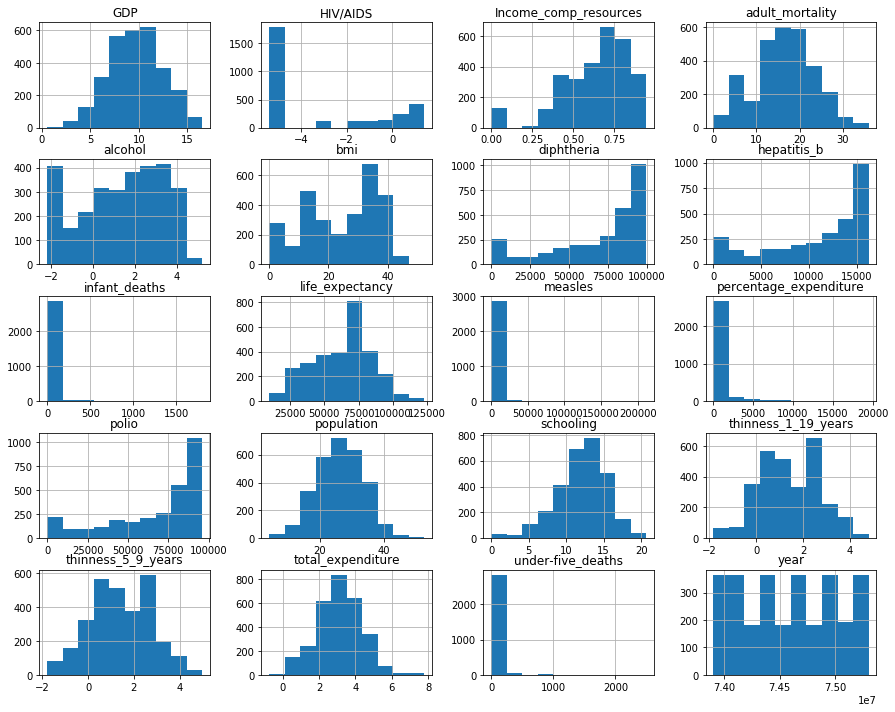

In [20]:
### looking at histogram to see if the distributions look better than before
df_lifeExpectancy2.hist(figsize=(15, 12))

* Running Jacque-bera and normality test on this new dataframe with only positive columns to see if the distributions are no normal

* Lets run some tests to see how we did

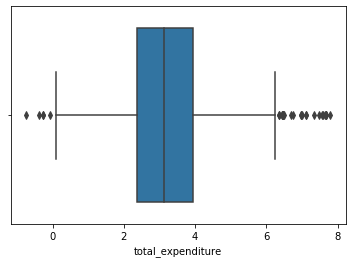

In [22]:
### looking at box plot of total expenditure and compare with the previous one
sns.boxplot(x=df_lifeExpectancy2['total_expenditure'])

In [23]:
jb_stats = jarque_bera(df_lifeExpectancy2)
norm_stats = normaltest(df_lifeExpectancy2)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

### the normality tests are showing only one to be normally distributed 1.52978629e-001

Jarque-Bera test statistics is 721961.081832365 and p value is 0.0
Normality test statistics is [2.75812062e+03 7.67365386e+01 2.11322540e+01 4.53930845e+03
 6.97537204e+02 2.77794609e+03 3.56463259e+02 4.46216505e+03
 2.28578330e+03 4.46330877e+03 3.70918777e+02 1.23999757e+01
 3.77625170e+02 1.92272495e+06 3.47800061e+01 3.75491410e+00
 5.35254239e+01 4.53290909e+01 5.34208633e+02 2.10597310e+02] and p value is [0.00000000e+000 2.17206272e-017 2.57744468e-005 0.00000000e+000
 3.40189397e-152 0.00000000e+000 3.93538111e-078 0.00000000e+000
 0.00000000e+000 0.00000000e+000 2.85766332e-081 2.02945534e-003
 9.99392833e-083 0.00000000e+000 2.80296479e-008 1.52978629e-001
 2.38287842e-012 1.43520183e-010 9.95564218e-117 1.85941018e-046]


In [25]:
### taking a few features and testing

jb_stats = jarque_bera(df_lifeExpectancy2.thinness_5_9_years)
norm_stats = normaltest(df_lifeExpectancy2.thinness_5_9_years)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

jb_stats = jarque_bera(df_lifeExpectancy2.total_expenditure)
norm_stats = normaltest(df_lifeExpectancy2.total_expenditure)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

### looks like these don't look normal

Jarque-Bera test statistics is 26.843328857951544 and p value is 1.4826723908623052e-06
Normality test statistics is 45.32909088071084 and p value is 1.4352018331285154e-10
Jarque-Bera test statistics is 16.33376033476954 and p value is 0.00028390236407371816
Normality test statistics is 12.399975657993144 and p value is 0.0020294553366532785


### Another option
* In order to appy box cox, we had to remove some columns because we need positive values. That makes us lose some columns which could contribute to the outcome.

* Another option is to use yeojohnson instead of Boxcox because it does the same thing. However, it requires the datatypes to be float. So int columns needs to be converted to float first.

In [26]:
df_lifeExpectancy3 = df_lifeExpectancy.copy()

In [32]:
#df_lifeExpectancy3['year'] = df_lifeExpectancy3['year'].astype(float)
#df_lifeExpectancy3['infant_deaths'] = df_lifeExpectancy3['infant_deaths'].astype(float)

df_lifeExpectancy3[['year','infant_deaths','measles','under-five_deaths']] = df_lifeExpectancy3[['year','infant_deaths','measles','under-five_deaths']].astype(float)
#df_lifeExpectancy3['infant_deaths','measles','under-five_deaths'] = df_lifeExpectancy3['infant_deaths','measles','under-five_deaths'].astype(float)

In [33]:
df_lifeExpectancy3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 20 columns):
year                      2938 non-null float64
life_expectancy           2938 non-null float64
adult_mortality           2938 non-null float64
infant_deaths             2938 non-null float64
alcohol                   2938 non-null float64
percentage_expenditure    2938 non-null float64
hepatitis_b               2938 non-null float64
measles                   2938 non-null float64
bmi                       2938 non-null float64
under-five_deaths         2938 non-null float64
polio                     2938 non-null float64
total_expenditure         2938 non-null float64
diphtheria                2938 non-null float64
HIV/AIDS                  2938 non-null float64
GDP                       2938 non-null float64
population                2938 non-null float64
thinness_1_19_years       2938 non-null float64
thinness_5_9_years        2938 non-null float64
Income_comp_resources     293

In [39]:
for cols in df_lifeExpectancy3.columns:
    #new_column_name = cols + '_boxcox'
    df_lifeExpectancy3[cols],_ = yeojohnson(df_lifeExpectancy3[cols])
    #print(df_lifeExpectancy3[cols].dtype)

#new_column_name
df_lifeExpectancy3

,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,HIV/AIDS,GDP,population,thinness_1_19_years,thinness_5_9_years,Income_comp_resources,schooling
0,7.586852e+07,59154.004607,21.966825,2.631244,0.009961,4.428511,8325.981141,4.839565,14.589876,2.870100,83.011402,4.191710,46366.705465,0.087144,7.604444,36.573937,2.562397,2.642781,0.946888,25.328623
1,7.577427e+07,46944.119751,22.270727,2.642828,0.009961,4.461230,7460.401196,4.440540,14.247530,2.883731,32781.903622,4.198700,40682.723727,0.087144,7.671441,21.635061,2.575072,2.651734,0.937201,24.971339
2,7.568009e+07,46944.119751,22.157385,2.653978,0.009961,4.456849,8031.367581,4.373918,13.904075,2.896804,39398.586803,4.181211,44418.737598,0.087144,7.714695,36.339393,2.583398,2.660584,0.918003,24.615772
3,7.558598e+07,46063.198635,22.308345,2.669952,0.009961,4.526195,8933.636843,5.213627,13.559479,2.913435,48802.646175,4.316450,50425.898584,0.087144,7.797874,28.776846,2.591627,2.673672,0.895902,24.261930
4,7.549194e+07,45409.632304,22.420719,2.680137,0.009961,2.126425,9246.745154,5.244933,13.282956,2.929230,50840.908878,4.089524,52538.452351,0.087144,4.672875,28.084246,2.603796,2.682276,0.867948,23.210830
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,7.483564e+07,20050.627178,34.642311,2.298394,2.028985,0.000000,9246.745154,2.861049,19.937863,2.589520,48802.646175,3.821343,46366.705465,0.523361,7.252918,32.985007,2.117452,2.168292,0.730188,22.175528
2934,7.474217e+07,20306.161887,34.471838,2.281904,1.946331,0.000000,56.862228,4.774275,19.675554,2.578915,120.852572,3.591436,52538.452351,0.523453,7.249812,32.944795,2.148149,2.208404,0.761219,23.210830
2935,7.464876e+07,20693.430943,11.969040,2.264640,2.047749,0.000000,10906.387195,4.197722,19.412764,2.568000,61854.052139,3.595275,59215.874929,0.523525,4.546990,19.159044,0.761873,0.810225,0.787151,24.971339
2936,7.455543e+07,21349.525720,33.844354,2.264640,1.118663,0.000000,11978.590456,4.475991,19.149486,2.556757,69141.811460,3.451586,68936.394707,0.523569,7.515906,32.868693,0.916657,0.961107,0.787151,24.261930


In [ ]:
#yeojohnson_columns = df.select_dtypes(['float64']).columns
#for cols in yeojohnson_columns:
    #new_column_name = cols + '_boxcox'
    #df_yeojohnson[cols],_ = yeojohnson(df_lifeExpectancy[cols])
    #print(new_column_name)

#new_column_name
#df_yeojohnson 

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a22b1b350>,
      dtype=object)

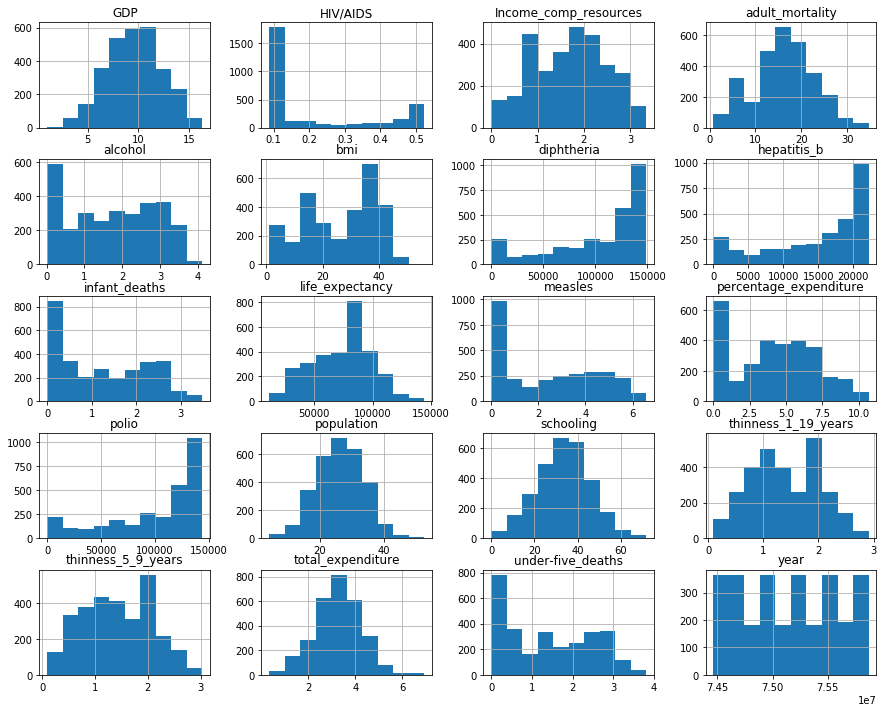

In [40]:
df_lifeExpectancy3.hist(figsize=(15, 12))

* At first glance looks like 

- total_expenditure
- schooling
- population
- gdp

- these might have achieved normality

In [41]:
### test for normality

jb_stats = jarque_bera(df_lifeExpectancy3)
norm_stats = normaltest(df_lifeExpectancy3)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))


Jarque-Bera test statistics is 721953.1864262356 and p value is 0.0
Normality test statistics is [2.75812066e+03 7.62852178e+01 2.35543701e+01 1.00657617e+04
 6.84851577e+03 6.20798629e+02 3.62848123e+02 2.41672436e+04
 2.72871827e+03 9.69664393e+03 3.62901894e+02 8.96851521e+00
 3.68680414e+02 5.91711846e+02 3.85856482e+01 3.79064072e+00
 3.54696540e+02 2.96629986e+02 1.92829712e+02 2.08520155e+00] and p value is [0.00000000e+000 2.72192049e-017 7.67774226e-006 0.00000000e+000
 0.00000000e+000 1.56779989e-135 1.61633460e-079 0.00000000e+000
 0.00000000e+000 0.00000000e+000 1.57345715e-079 1.12852625e-002
 8.75115217e-081 3.24642365e-129 4.18054551e-009 1.50270187e-001
 9.51973647e-078 3.86916264e-065 1.34140540e-042 3.52536621e-001]


In [43]:
### taking a few features and testing
jb_stats = jarque_bera(df_lifeExpectancy3.schooling)
norm_stats = normaltest(df_lifeExpectancy3.schooling)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))


jb_stats = jarque_bera(df_lifeExpectancy3.thinness_5_9_years)
norm_stats = normaltest(df_lifeExpectancy3.thinness_5_9_years)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

jb_stats = jarque_bera(df_lifeExpectancy3.total_expenditure)
norm_stats = normaltest(df_lifeExpectancy3.total_expenditure)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

### looks like these don't look normal

Jarque-Bera test statistics is 2.052000476184218 and p value is 0.3584377629377806
Normality test statistics is 2.085201546888973 and p value is 0.3525366207601875
Jarque-Bera test statistics is 86.37827013378225 and p value is 0.0
Normality test statistics is 296.629985866741 and p value is 3.8691626388609915e-65
Jarque-Bera test statistics is 11.15654772503222 and p value is 0.003779083109054726
Normality test statistics is 8.968515207997726 and p value is 0.011285262545348963


* other than schooling - no other looks like they have been normalized... 

* Explore the data using univariate and multivariate exploration techniques. You should pay special attention to your target variable. In this regard, your focus should be on finding the relevant variables that may affect life expectancy.

<Figure size 2160x1440 with 0 Axes>

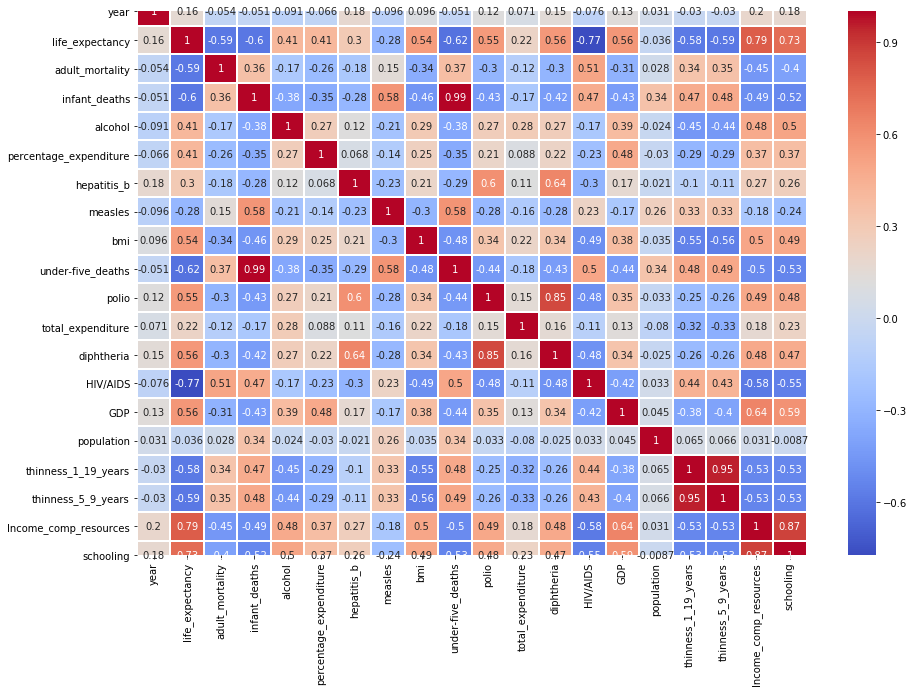

In [44]:
### lets look at the data correlation

plt.figure(figsize=(30,20))
plt.subplots(figsize=(15, 10))
#sns.heatmap(df2.select_dtypes(include = ['number']).corr(), annot=True, linewidths=.5, cmap = 'coolwarm')
sns.heatmap(df_lifeExpectancy3.select_dtypes(include = ['number']).corr(), 
            linewidths=1, annot=True, cmap = 'coolwarm')
plt.show()

* Looks like the not so correlated features

- total_expenditure
- hepatitis_b
- year

- thinness_5_9_years
- thinness_1_19_years
- HIV/AIDS
- adult_mortality
- measles
- population


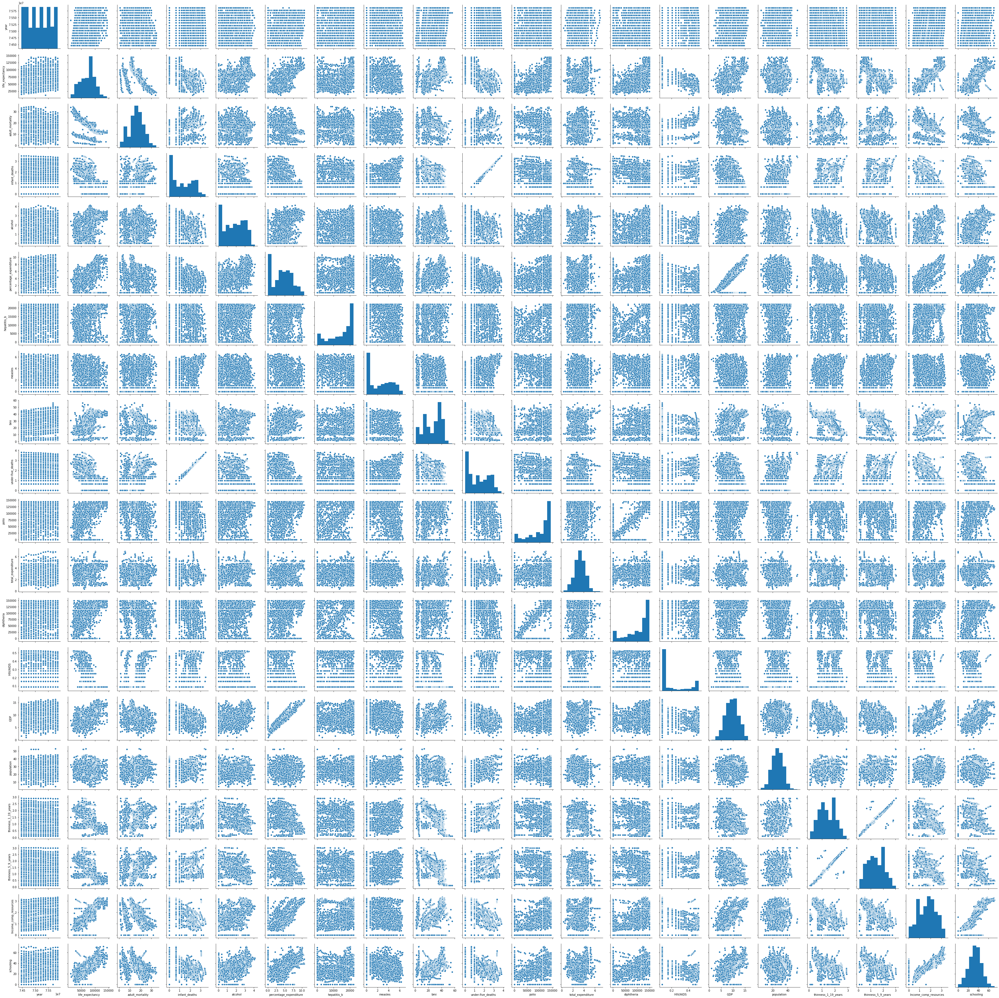

In [45]:
sns.pairplot(df_lifeExpectancy3)
# scatter plot to see correlation of all the column agaist life expectancy

## Select Features

* In the feature engineering step, you need to select a suite of variables that you think would be ideal in the modeling phase. More concretely, you may discard some variables that are very correlated with the other ones or the variables that you think irrelevant with the life expectancy.

* Summarize your findings. One of the most important skills of a data scientist is to convey ideas and findings to nontechnical people using understandable language. In this regard, one of the most effective ways to communicate your ideas is to do it using effective visualization.

### Correlation
Life expectancey and related variables

9 out of 20 numeric variables seems to have correlation with life expectancy. some correlation are negetive

- total_expenditure
- hepatitis_b
- year

* These have negetive correlation with life_expectancey. 
- thinness_5_9_years
- thinness_1_19_years
- HIV/AIDS
- adult_mortality
- measles
- population

### ### Magda Questions: Result
* Summarize your findings. One of the most important skills of a data scientist is to convey ideas and findings to nontechnical people using understandable language. In this regard, one of the most effective ways to communicate your ideas is to do it using effective visualization.